<a href="https://www.kaggle.com/code/sophiazhang17/predict-time-to-diagnosis-widsdatathon?scriptVersionId=178606053" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os    
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
import re
import tensorflow as tf

from category_encoders import OneHotEncoder, MEstimateEncoder, CatBoostEncoder, OrdinalEncoder
from sklearn import set_config
from sklearn.inspection import permutation_importance
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin, clone
from sklearn.preprocessing import FunctionTransformer, StandardScaler, LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier, RidgeClassifierCV, LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, HistGradientBoostingClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier, StackingClassifier, HistGradientBoostingRegressor, VotingRegressor, StackingRegressor, AdaBoostRegressor
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from xgboost import XGBClassifier, XGBRFClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier



sns.set_theme(style = 'white', palette = 'viridis')
pal = sns.color_palette('viridis')


pd.set_option('display.max_rows', 100)
set_config(transform_output = 'pandas')
pd.options.mode.chained_assignment = None

#Load dataset
train = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/training.csv", index_col = 'patient_id')
test = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/test.csv",index_col = 'patient_id')


/kaggle/input/widsdatathon2024-challenge1/sample_submission.csv
/kaggle/input/widsdatathon2024-challenge1/training.csv
/kaggle/input/widsdatathon2024-challenge1/test.csv


# Descrptive Statistics


train data

In [2]:
numerical_features = list(test._get_numeric_data())
print(numerical_features)
#some chances to mess with those columns that add up to 100%?
# numerical_features_pct = ['age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 
#                           'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 
#                           'male', 'female', 'married', 'divorced', 'never_married', 'widowed', 
#                         'family_dual_income', 'income_household_under_5', 'income_household_5_to_10', 
#                           'income_household_10_to_15', 'income_household_15_to_20', 'income_household_20_to_25', 
#                           'income_household_25_to_35', 'income_household_35_to_50', 'income_household_50_to_75', 
#                           'income_household_75_to_100', 'income_household_100_to_150', 'income_household_150_over', 
#                           'income_household_six_figure', 'home_ownership',   'education_less_highschool', 
#                           'education_highschool', 'education_some_college', 'education_bachelors', 'education_graduate', 
#                           'education_college_or_above', 'education_stem_degree',   
#                           'race_white', 'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other', 'race_multiple',
#                           'hispanic', 'disabled', 'poverty', 'limited_english', 'commute_time', 'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02']
# print('Number of Numerical Features:',len(numerical_features))

categorical_features = list(test.drop(numerical_features, axis = 1))
print('Number of Categorical Features:',len(categorical_features))
print(categorical_features)

['patient_zip3', 'patient_age', 'bmi', 'population', 'density', 'age_median', 'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male', 'female', 'married', 'divorced', 'never_married', 'widowed', 'family_size', 'family_dual_income', 'income_household_median', 'income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20', 'income_household_20_to_25', 'income_household_25_to_35', 'income_household_35_to_50', 'income_household_50_to_75', 'income_household_75_to_100', 'income_household_100_to_150', 'income_household_150_over', 'income_household_six_figure', 'income_individual_median', 'home_ownership', 'housing_units', 'home_value', 'rent_median', 'rent_burden', 'education_less_highschool', 'education_highschool', 'education_some_college', 'education_bachelors', 'education_graduate', 'education_college_or_above', 'education_stem_degree', 'labor_force_participation', 'unemploym

In [3]:
train.head(10)

,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,,,,,,,
475714,NaN,MEDICAID,CA,924,84,F,NaN,C50919,Malignant neoplasm of unsp site of unspecified...,C7989,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
349367,White,COMMERCIAL,CA,928,62,F,28.49,C50411,Malig neoplm of upper-outer quadrant of right ...,C773,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
138632,White,COMMERCIAL,TX,760,43,F,38.09,C50112,Malignant neoplasm of central portion of left ...,C773,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1
617843,White,COMMERCIAL,CA,926,45,F,NaN,C50212,Malig neoplasm of upper-inner quadrant of left...,C773,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,0
817482,NaN,COMMERCIAL,ID,836,55,F,NaN,1749,"Malignant neoplasm of breast (female), unspeci...",C773,...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,0
111545,White,MEDICARE ADVANTAGE,NY,141,66,F,NaN,1749,"Malignant neoplasm of breast (female), unspeci...",C7981,...,13.717143,8.888235,0.638235,25.000000,4.797143,7.745714,40.107248,6.181812,13.562528,0
914071,NaN,COMMERCIAL,CA,900,51,F,29.05,C50912,Malignant neoplasm of unspecified site of left...,C779,...,11.901538,20.760000,14.737500,30.709375,10.341538,3.030769,41.186992,11.166898,21.644261,1
479368,White,COMMERCIAL,IL,619,60,F,NaN,C50512,Malig neoplasm of lower-outer quadrant of left...,C773,...,15.260000,10.890000,0.503333,24.275862,8.753333,7.506667,37.646770,7.295977,12.914805,1
994014,White,MEDICARE ADVANTAGE,NaN,973,82,F,NaN,1744,Malignant neoplasm of upper-outer quadrant of ...,C7800,...,19.371875,14.593651,1.620968,26.015254,6.645313,10.955385,36.323573,4.744352,10.439314,0


In [4]:
desc = pd.DataFrame(index = list(train))
numeric_cols = train.select_dtypes(include = ['int','float']).columns

desc['type'] = train.dtypes
desc['count'] = train.count()
desc['nunique'] = train.nunique()
desc['%unique'] = desc['nunique']/ len(train) * 100
desc['null']= train.isnull().sum()
desc['%null'] = desc['null'] / len(train) * 100
desc['min'] = train[numeric_cols].min()
desc['max'] = train[numeric_cols].max()

desc

,type,count,nunique,%unique,null,%null,min,max
patient_race,object,6521,5,0.038742,6385,49.473113,NaN,NaN
payer_type,object,11103,3,0.023245,1803,13.970246,NaN,NaN
patient_state,object,12855,50,0.387417,51,0.395165,NaN,NaN
patient_zip3,int64,12906,739,5.726019,0,0.000000,101.000000,9.990000e+02
patient_age,int64,12906,67,0.519138,0,0.000000,18.000000,9.100000e+01
patient_gender,object,12906,1,0.007748,0,0.000000,NaN,NaN
bmi,float64,3941,1342,10.398264,8965,69.463815,14.000000,8.500000e+01
breast_cancer_diagnosis_code,object,12906,50,0.387417,0,0.000000,NaN,NaN
breast_cancer_diagnosis_desc,object,12906,50,0.387417,0,0.000000,NaN,NaN
metastatic_cancer_diagnosis_code,object,12906,43,0.333178,0,0.000000,NaN,NaN


test data

In [5]:
pd.set_option('display.max_columns', 99)
test.head(10)

,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,metastatic_first_novel_treatment,metastatic_first_novel_treatment_type,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
patient_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
573710,White,MEDICAID,IN,467,54,F,NaN,C50412,Malig neoplasm of upper-outer quadrant of left...,C773,NaN,NaN,Midwest,East North Central,5441.435484,85.620968,40.880328,12.732258,14.088710,10.659677,11.625806,11.208065,15.619355,12.322581,8.409677,3.343548,49.154839,50.845161,55.175806,13.982258,24.266129,6.583871,3.073226,52.980645,66187.22807,1.611290,1.277419,2.645161,3.853226,3.172581,13.275806,12.633871,21.485484,16.717742,15.238710,8.070968,23.309677,33553.43333,84.112903,2064.741935,1.527495e+05,825.122449,23.895455,12.429032,40.667742,28.959677,11.895161,6.046774,17.941935,35.591379,63.303226,3.406557,10.655357,5.551786,94.793548,0.364516,0.303226,0.119355,0.009677,0.770968,3.630645,3.564516,13.996774,7.985484,0.969355,24.955357,10.838710,8.080645,38.724876,7.947165,11.157161
593679,NaN,COMMERCIAL,FL,337,52,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,C787,NaN,NaN,South,South Atlantic,19613.820510,1555.107692,49.107692,8.069231,8.587179,10.684615,11.302564,10.971795,15.823077,15.902564,11.828205,6.815385,49.658974,50.341026,44.800000,17.779487,29.102564,8.310256,2.917105,46.665789,64711.71053,3.873684,2.044737,3.807895,4.239474,4.242105,9.347368,13.018421,17.373684,12.889474,14.442105,14.702632,29.144737,34678.61538,68.673684,8502.230769,2.658606e+05,1343.394737,34.957895,8.379487,26.558974,30.200000,22.100000,12.764103,34.864103,43.250000,57.035897,5.002632,11.564103,0.005128,78.217949,10.889744,3.453846,0.187179,0.076923,1.841026,5.328205,10.261538,16.020513,13.602564,2.836842,23.952632,10.579487,9.302564,36.918257,7.838973,13.599985
184532,Hispanic,MEDICAID,CA,917,61,F,NaN,C50911,Malignant neoplasm of unsp site of right femal...,C773,NaN,NaN,West,Pacific,43030.500000,2048.578261,38.852174,11.306522,12.897826,14.121739,13.532609,13.160870,13.378261,11.473913,6.380435,3.736957,49.052174,50.947826,48.504348,10.117391,36.408696,4.969565,3.674783,59.219565,86330.39130,2.226087,1.528261,2.897826,2.747826,3.173913,6.647826,9.617391,15.965217,13.589130,19.752174,21.847826,41.600000,34317.82609,61.397826,12609.260870,5.726065e+05,1778.000000,34.595652,17.491304,22.656522,29.263043,20.200000,10.404348,30.604348,46.208696,63.154348,6.197826,15.708696,0.015217,38.708696,3.963043,25.565217,1.193478,0.269565,18.858696,11.426087,47.726087,9.895652,10.515217,12.745652,32.530435,7.263043,3.810870,47.310325,9.595719,20.084231
447383,Hispanic,MEDICARE ADVANTAGE,CA,917,64,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,C779,NaN,NaN,West,Pacific,43030.500000,2048.578261,38.852174,11.306522,12.897826,14.121739,13.532609,13.160870,13.378261,11.473913,6.38

In [6]:
desc = pd.DataFrame(index = list(test))
numeric_cols = test.select_dtypes(include = ['int','float']).columns

desc['type'] = train.dtypes
desc['count'] = train.count()
desc['nunique'] = train.nunique()
desc['%unique'] = desc['nunique']/ len(train) * 100
desc['null']= train.isnull().sum()
desc['%null'] = desc['null'] / len(train) * 100
desc['min'] = train[numeric_cols].min()
desc['max'] = train[numeric_cols].max()

desc

,type,count,nunique,%unique,null,%null,min,max
patient_race,object,6521,5,0.038742,6385,49.473113,NaN,NaN
payer_type,object,11103,3,0.023245,1803,13.970246,NaN,NaN
patient_state,object,12855,50,0.387417,51,0.395165,NaN,NaN
patient_zip3,int64,12906,739,5.726019,0,0.000000,101.000000,9.990000e+02
patient_age,int64,12906,67,0.519138,0,0.000000,18.000000,9.100000e+01
patient_gender,object,12906,1,0.007748,0,0.000000,NaN,NaN
bmi,float64,3941,1342,10.398264,8965,69.463815,14.000000,8.500000e+01
breast_cancer_diagnosis_code,object,12906,50,0.387417,0,0.000000,NaN,NaN
breast_cancer_diagnosis_desc,object,12906,50,0.387417,0,0.000000,NaN,NaN
metastatic_cancer_diagnosis_code,object,12906,43,0.333178,0,0.000000,NaN,NaN


# Adversatial Validation


In [7]:
def adversarial_validation(dataset_1 = train, dataset_2 = test, label = 'Train-Test'):

    adv_train = dataset_1.drop('DiagPeriodL90D', axis = 1)
    adv_test = dataset_2.copy()

    adv_train['is_test'] = 0
    adv_test['is_test'] = 1

    adv = pd.concat([adv_train, adv_test], ignore_index = True)

    adv_shuffled = adv.sample(frac = 1)

    adv_X = adv_shuffled.drop('is_test', axis = 1)
    adv_y = adv_shuffled.is_test

    skf = StratifiedKFold(n_splits = 5, random_state = 42, shuffle = True)

    val_scores = []
    predictions = np.zeros(len(adv))

    for fold, (train_idx, val_idx) in enumerate(skf.split(adv_X, adv_y)):
    
        adv_lr = make_pipeline(MEstimateEncoder(cols = categorical_features), XGBClassifier(random_state = 42))
        adv_lr.fit(adv_X.iloc[train_idx], adv_y.iloc[train_idx])
        
        val_preds = adv_lr.predict_proba(adv_X.iloc[val_idx])[:,1]
        predictions[val_idx] = val_preds
        val_score = roc_auc_score(adv_y.iloc[val_idx], val_preds)
        val_scores.append(val_score)
    
    fpr, tpr, _ = roc_curve(adv['is_test'], predictions)
    
    plt.figure(figsize = (10, 10), dpi = 300)
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle="--", label="Indistinguishable Datasets")
    sns.lineplot(x=fpr, y=tpr, label="Adversarial Validation Classifier")
    plt.title(f'{label} Validation = {np.mean(val_scores):.5f}', weight = 'bold', size = 17)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

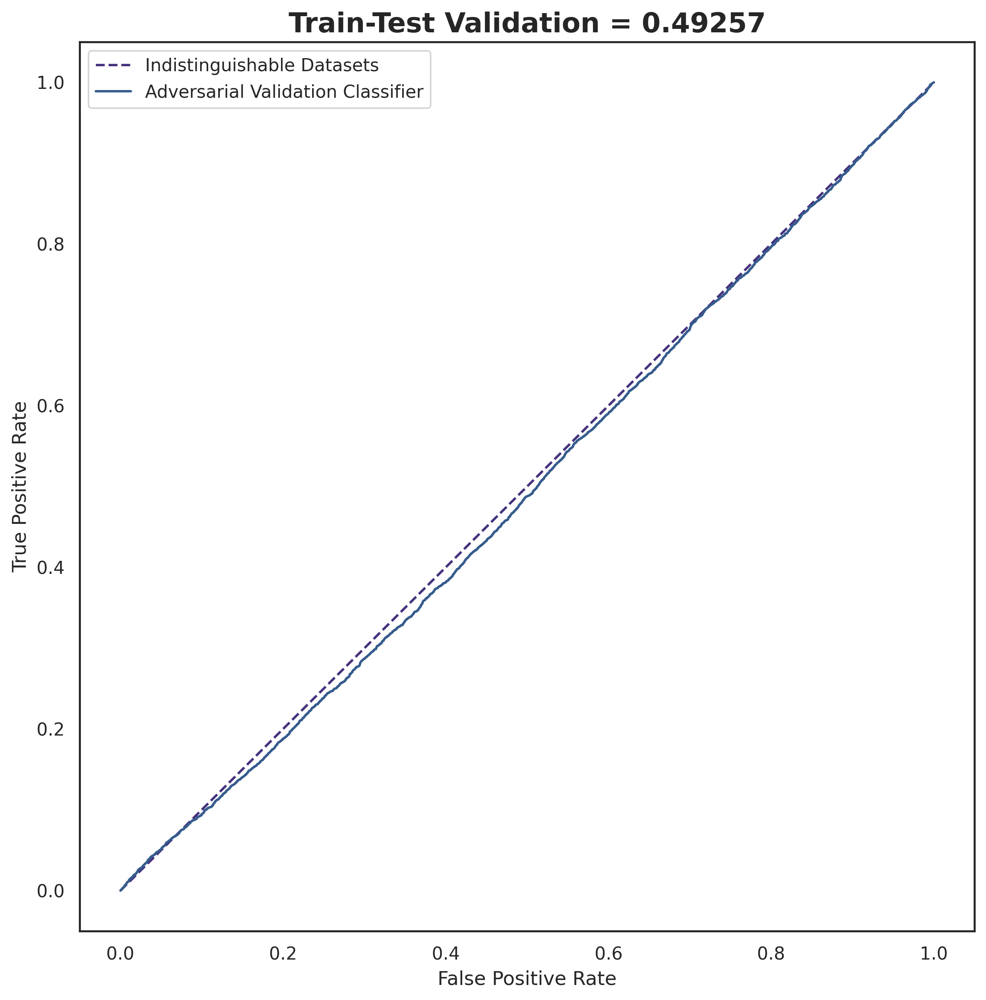

In [8]:
adversarial_validation()

Note: train and test data sets are similar (score close to 0.5). I can prob trust CV score.

# Distribution of Numerical Features

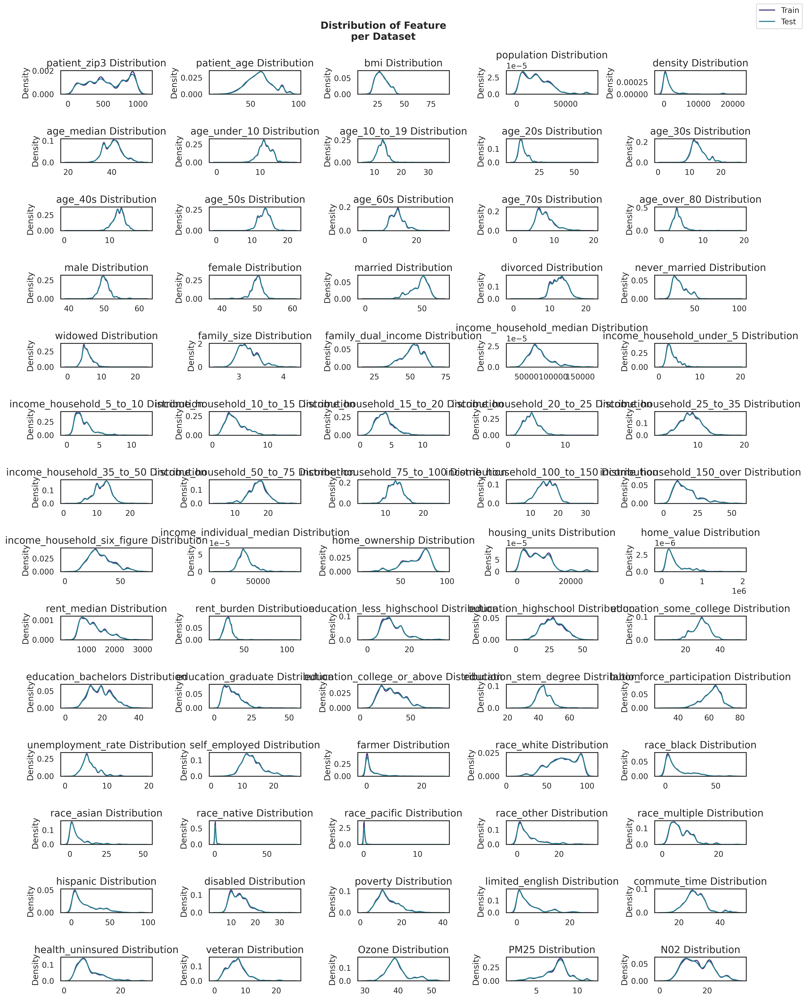

In [9]:
fig, ax = plt.subplots(14, 5, figsize = (15, 20), dpi = 300)
ax = ax.flatten()

for i, column in enumerate(numerical_features):
        
    sns.kdeplot(train[column], ax=ax[i], color=pal[0])
    sns.kdeplot(test[column], ax=ax[i], color=pal[2], warn_singular = False)
    
    ax[i].set_title(f'{column} Distribution', size = 14)
    ax[i].set_xlabel(None)
    
fig.suptitle('Distribution of Feature\nper Dataset\n', fontsize = 14, fontweight = 'bold')
fig.legend(['Train', 'Test'])
plt.tight_layout()

# Distribution of Categorical Features

In [10]:
fig, ax = plt.subplots(11,2 , figsize = (16, 40), dpi = 300)

for i, column in enumerate(categorical_features[1:]):

    ax[i][0].pie(
        train[column].value_counts(), 
        shadow = True, 
        explode = [.1 for i in range(train[column].nunique())], 
        autopct = '%1.f%%',
        textprops = {'size' : 14, 'color' : 'white'}
    )

    sns.countplot(data = train, y = column, ax = ax[i][1], palette = 'viridis', order = train[column].value_counts().index)
    ax[i][1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 12)
    ax[i][1].set_xlabel('Count in Train', fontsize = 15)
    ax[i][1].set_ylabel(f'{column}', fontsize = 15)
    plt.xticks(fontsize = 12)

fig.suptitle('Distribution of Categorical Features\nin Train Dataset\n\n\n\n', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

# Target distribution

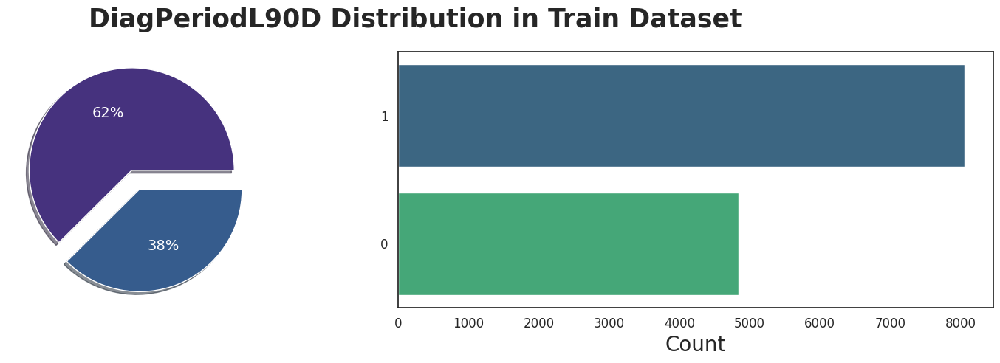

In [11]:
fig, ax = plt.subplots(1, 2, figsize = (16, 5))
ax = ax.flatten()

ax[0].pie(
    train['DiagPeriodL90D'].value_counts(), 
    shadow = True, 
    explode = [.1 for i in range(train.DiagPeriodL90D.nunique())], 
    autopct = '%1.f%%',
    textprops = {'size' : 14, 'color' : 'white'}
)

sns.countplot(data = train, y = 'DiagPeriodL90D', ax = ax[1], palette = 'viridis', order = train['DiagPeriodL90D'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count', fontsize = 20)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)

fig.suptitle('DiagPeriodL90D Distribution in Train Dataset', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

# Correlation

In [12]:
def heatmap(dataset, label = None,save_path=None):
    corr = dataset.corr(method = 'spearman')
    plt.figure(figsize = (50, 50), dpi = 300)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr, mask = mask, cmap = 'viridis', annot = True, annot_kws = {'size' : 12})
    plt.title(f'{label} Dataset Correlation Matrix\n', fontsize = 25, weight = 'bold')
    plt.show()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
        plt.show()
    else:
        plt.show()

In [13]:
heatmap(train._get_numeric_data(), 'train', save_path = '/kaggle/working/heatmap.png')


<Figure size 640x480 with 0 Axes>

# Hierarchial Clustering

In [14]:
def distance(data, label = ''):
    #thanks to @sergiosaharovsky for the fix
    corr = data.corr(method = 'spearman')
    dist_linkage = linkage(squareform(1 - abs(corr)), 'complete')
    
    plt.figure(figsize = (10, 8), dpi = 300)
    dendro = dendrogram(dist_linkage, labels=data.columns, leaf_rotation=90)
    plt.title(f'Feature Distance in {label} Dataset', weight = 'bold', size = 20)
    plt.show()

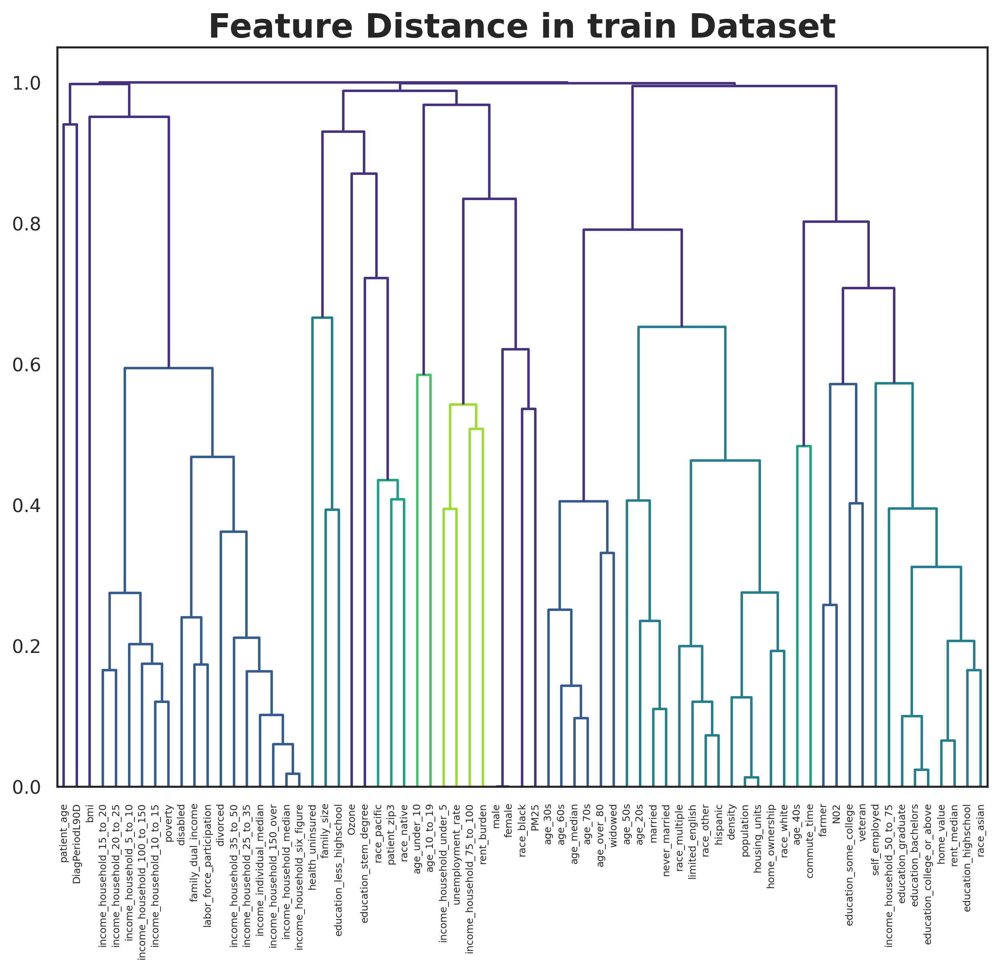

In [15]:
distance(train._get_numeric_data(), 'train')

Note: what does this mean? look into after lunch

# New Prep

In [16]:
X = train.copy()
y = X.pop('DiagPeriodL90D')

seed = 42
splits = 5
skf = StratifiedKFold(n_splits = splits, random_state = seed, shuffle = True)
tf.keras.utils.set_random_seed(seed)
tf.config.experimental.enable_op_determinism()


print("Missing categorical features:", X[categorical_features].isnull().sum())
print("Missing numerical features:", X[numerical_features].isnull().sum())

Missing categorical features: patient_race                              6385
payer_type                                1803
patient_state                               51
patient_gender                               0
breast_cancer_diagnosis_code                 0
breast_cancer_diagnosis_desc                 0
metastatic_cancer_diagnosis_code             0
metastatic_first_novel_treatment         12882
metastatic_first_novel_treatment_type    12882
Region                                      52
Division                                    52
dtype: int64
Missing numerical features: patient_zip3                      0
patient_age                       0
bmi                            8965
population                        1
density                           1
age_median                        1
age_under_10                      1
age_10_to_19                      1
age_20s                           1
age_30s                           1
age_40s                           1
age_50s         

# Feature Engineering

In [17]:
# class SimpleCategoricalImputer(BaseEstimator, TransformerMixin):
#     def __init__(self):
#         pass
    
#     def fit(self, X, y = None):
#         return self
    
#     def transform(self, X, y = None):
#         X_copy = X.copy()
#         cols_to_impute = [
#             'patient_race',
#             'payer_type',
#             'patient_state',
#             'patient_gender',
#             'breast_cancer_diagnosis_code',
#             'breast_cancer_diagnosis_desc',
#             'metastatic_cancer_diagnosis_code',
#             'metastatic_first_novel_treatment',
#             'metastatic_first_novel_treatment_type',
#             'Region',
#             'Division'
#         ]

#         for col in cols_to_impute:
#             X_copy[col] = X_copy[col].fillna('Missing')
            
#         return X_copy

In [18]:
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('categorical', SimpleCategoricalImputer(), categorical_features),
#         ('numerical', StandardScaler(), numerical_features)  # You can use SimpleImputer instead of StandardScaler if you want to impute missing values for numerical features
#     ],
#     remainder='passthrough'  # If there are other columns not specified in numerical or categorical features, they will be passed through
# )

# # Create the final pipeline
# full_pipeline = Pipeline([
#     ('preprocessor', preprocessor),
#     # Add additional steps to the pipeline if needed
# ])



In [19]:
# # Fit and transform the data
# preprocessed_data = full_pipeline.fit_transform(train)

Before going on, we need to do preprocessing on our column names too. This is because XGBoost can't accept column name with `[`, `]`, and `<` character.


In [20]:
# #https://stackoverflow.com/questions/48645846/pythons-xgoost-valueerrorfeature-names-may-not-contain-or
# regex = regex = re.compile(r"\[|\]|<", re.IGNORECASE)
# preprocessed_data.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in preprocessed_data.columns.values]

In [21]:
# def std_scaling(x):
#     x_copy = x.copy()
#     print("Standard scaling...")
#     std_scale_features = x_copy[['patient_age','bmi','population', 'density', 'age_median','family_size','income_household_median','income_individual_median','housing_units', 'home_value', 'rent_median','commute_time','Ozone', 'PM25', 'N02']]
#     scaler = StandardScaler()
#     # Update the original DataFrame with the scaled values
#     x_copy[std_scale_features.columns] = scaler.fit_transform(std_scale_features)
#     print(x_copy[std_scale_features.columns].head(10))
#     return x_copy

# StdScaling = FunctionTransformer(std_scaling)

# #test1 = StdScaling.transform(train)

# #print(test1)
# #print(null)


In [22]:
# def pct_scaling(x):
#     x_copy = x.copy()
#     print("Percent scaling...")
#     pct_scale_features = x_copy[['age_under_10', 'age_10_to_19',
#        'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s',
#        'age_over_80', 'male', 'female', 'married', 'divorced', 'never_married',
#        'widowed',  'family_dual_income',
#        'income_household_under_5',
#        'income_household_5_to_10', 'income_household_10_to_15',
#        'income_household_15_to_20', 'income_household_20_to_25',
#        'income_household_25_to_35', 'income_household_35_to_50',
#        'income_household_50_to_75', 'income_household_75_to_100',
#        'income_household_100_to_150', 'income_household_150_over',
#        'income_household_six_figure', 
#        'home_ownership', 
#        'rent_burden', 'education_less_highschool', 'education_highschool',
#        'education_some_college', 'education_bachelors', 'education_graduate',
#        'education_college_or_above', 'education_stem_degree',
#        'labor_force_participation', 'unemployment_rate', 'self_employed',
#        'farmer', 'race_white', 'race_black', 'race_asian', 'race_native',
#        'race_pacific', 'race_other', 'race_multiple', 'hispanic', 'disabled',
#        'poverty', 'limited_english',  'health_uninsured',
#        'veteran']]
#     x_copy[pct_scale_features.columns] = pct_scale_features/100
#     print(x_copy[pct_scale_features.columns].head(10))
#     return x_copy
    
# PctScaling = FunctionTransformer(pct_scaling)
 
    
# #test1 = PctScaling.transform(train)

# #print(test1)
# #print(null)

In [23]:
# no_scale= ['patient_race', 'payer_type', 'patient_state', 'patient_zip3',
#         'patient_gender',  'breast_cancer_diagnosis_code',
#        'breast_cancer_diagnosis_desc', 'metastatic_cancer_diagnosis_code',
#        'metastatic_first_novel_treatment',
#        'metastatic_first_novel_treatment_type', 'Region', 'Division',
#       'DiagPeriodL90D', 'bmi_was_missing',
#        'Ozone_was_missing', 'PM25_was_missing', 'N02_was_missing']

In [24]:
def feature_generator(x):
    pass

FeatureGenerator = FunctionTransformer(feature_generator)


In [25]:
def svd_rounder(x):
    
    x_copy = x.copy()
    for col in [column for column in list(x) if 'SVD' in column]:
        x_copy[col] = (x_copy[col] * 1e18).astype(np.int64)
        
    return x_copy

SVDRounder = FunctionTransformer(svd_rounder)

In [26]:
class FeatureDropper(BaseEstimator, TransformerMixin):
    
    def __init__(self, cols):
        self.cols = cols
        
    def fit(self, x, y):
        return self
    
    def transform(self, x):
        return x.drop(self.cols, axis = 1)

In [27]:
#Not sure if I will need this. PLACEHOLDER
class Categorizer(BaseEstimator, TransformerMixin):
    
    def __init__(self, cols : list):
        self.cols = cols
        
    def fit(self, x, y):
        return self
    
    def transform(self, x):
        return x.astype({cat : 'category' for cat in self.cols})

In [28]:
   
class Vectorizer(BaseEstimator, TransformerMixin):
    
    def __init__(self, max_features = 10000, cols = ['patient_zip3'], n_components = 3):
        self.max_features = max_features
        self.cols = cols
        self.n_components = n_components
        print("Vectorizing. Initializing...")
        

        
    def fit(self, X, y=None):
        print("Vectorizing. Fitting...")
        self.vectorizer_dict = {}
        self.decomposer_dict = {}
        X = list(X)
        y = list(y)
        
        for col in self.cols:
            print(f"Fitting {col}")
#             print(f"X: {X}")  # Add this line to check the entire input data
#             print(f"col: {col}")  # Add this line to check the current column name
#             print(f"X[{col}].astype(str): {X[col].astype(str)}")
#             print(f"y: {y}")
#             print("Missing values in X_train:", X.isnull().sum())
#             print("Missing values in y_train:", y.isnull().sum())
#             print("Missing values in X_val:", X.isnull().sum())
#             print("Missing values in y_val:", y.isnull().sum())
            self.vectorizer_dict[col] = TfidfVectorizer(max_features=self.max_features).fit(X[col].astype(str))
            print("middle")
            self.decomposer_dict[col] = TruncatedSVD(random_state=seed, n_components=self.n_components).fit(
                self.vectorizer_dict[col].transform(X[col].astype(str))
            )

        print("Fit completed")
        return self
    
    def transform(self, x):
        vectorized = {}
        
        for col in self.cols:
            vectorized[col] = self.vectorizer_dict[col].transform(x[col].astype(str))
            vectorized[col] = self.decomposer_dict[col].transform(vectorized[col])
        
        vectorized_df = pd.concat([pd.DataFrame(vectorized[col]).rename({
            f'truncatedsvd{i}' : f'{col}SVD{i}' for i in range(self.n_components)
        }, axis = 1) for col in self.cols], axis = 1)
        
        return pd.concat([x.reset_index(drop = True), vectorized_df], axis = 1)

# Model Cross Validation

In [29]:
def cross_val_score(estimator, cv = skf, label = '', show_importance = False):
 
    #initiate prediction arrays and score lists
    val_predictions = np.zeros((len(X)))
    train_scores, val_scores= [], []
    
    feature_importances_table = pd.DataFrame({'value' : 0}, index = list(X.columns))

    #training model, predicting prognosis probability, and evaluating metrics
    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        
        model = clone(estimator)

        
        #define train set
        X_train = X.iloc[train_idx].reset_index(drop = True)
        y_train = y.iloc[train_idx].reset_index(drop = True)
        
        #define validation set
        X_val = X.iloc[val_idx].reset_index(drop = True)
        y_val = y.iloc[val_idx].reset_index(drop = True)
        
        #train model

        model.fit(X_train,y_train)
        
        #make predictions
        train_preds = model.predict_proba(X_train)[:, 1]
        val_preds = model.predict_proba(X_val)[:, 1]
                  
        val_predictions[val_idx] += val_preds
        feature_importances_table['value'] += permutation_importance(model, 
                                                                     X_val, y_val, random_state = seed, 
                                                                     scoring = make_scorer(roc_auc_score, needs_proba = True),
                                                                     n_repeats = 5).importances_mean / cv.get_n_splits()
    
        #evaluate model for a fold
        train_score = roc_auc_score(y_train, train_preds)
        val_score = roc_auc_score(y_val, val_preds)
        
        #print(f'Fold {fold}: {val_score:.5f}')
        
        #append model score for a fold to list
        train_scores.append(train_score)
        val_scores.append(val_score)
       
    if show_importance:
        plt.figure(figsize = (20, 30))
        plt.title(f'Features with Biggest Importance of {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} Model', size = 25, weight = 'bold')
        sns.barplot(feature_importances_table.sort_values('value', ascending = False).T, orient = 'h', palette = 'viridis')
        plt.show()
    else:
        print(f'Val Score: {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} | Train Score: {np.mean(train_scores):.5f} ± {np.std(train_scores):.5f} | {label}')
        
    
    return val_scores, val_predictions

score_list, oof_list, predict_list = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()


In [30]:
score_list, oof_list = pd.DataFrame(), pd.DataFrame()

models = [
    ('log', LogisticRegression(random_state = seed, max_iter = 1000000)),
    ('lda', LinearDiscriminantAnalysis()),
    ('gnb', GaussianNB()),
    ('bnb', BernoulliNB()),
    ('rf', RandomForestClassifier(random_state = seed)),
    ('et', ExtraTreesClassifier(random_state = seed)),
    ('xgb', XGBClassifier(random_state = seed)),
    ('lgb', LGBMClassifier(random_state = seed)),
    ('dart', LGBMClassifier(random_state = seed, boosting_type = 'dart')),
    ('cb', CatBoostClassifier(random_state = seed, verbose = 0)),
    ('gb', GradientBoostingClassifier(random_state = seed)),
    ('hgb', HistGradientBoostingClassifier(random_state = seed)),
]

for (label, model) in models:
    score_list[label], oof_list[label] = cross_val_score(
        make_pipeline(MEstimateEncoder(cols = categorical_features),
                      SimpleImputer(strategy='mean'),
                      StandardScaler(), 
                    model),
        label = label
    )

Val Score: 0.79159 ± 0.00446 | Train Score: 0.81609 ± 0.00151 | log
Val Score: 0.79129 ± 0.00361 | Train Score: 0.81708 ± 0.00131 | lda
Val Score: 0.78061 ± 0.00908 | Train Score: 0.79076 ± 0.00114 | gnb
Val Score: 0.77700 ± 0.00876 | Train Score: 0.78373 ± 0.00137 | bnb
Val Score: 0.77311 ± 0.00433 | Train Score: 1.00000 ± 0.00000 | rf
Val Score: 0.76108 ± 0.00641 | Train Score: 1.00000 ± 0.00000 | et
Val Score: 0.78348 ± 0.00509 | Train Score: 0.98135 ± 0.00106 | xgb
Val Score: 0.79300 ± 0.00685 | Train Score: 0.94724 ± 0.00075 | lgb
Val Score: 0.79487 ± 0.00558 | Train Score: 0.91505 ± 0.00097 | dart
Val Score: 0.79194 ± 0.00398 | Train Score: 0.94551 ± 0.00021 | cb
Val Score: 0.79644 ± 0.00461 | Train Score: 0.86090 ± 0.00160 | gb
Val Score: 0.79376 ± 0.00340 | Train Score: 0.90763 ± 0.00551 | hgb


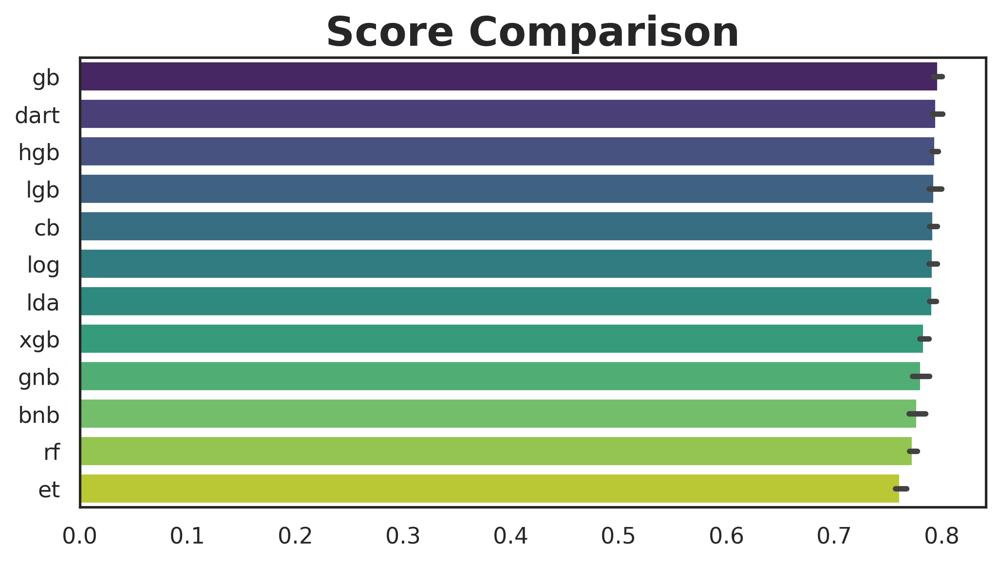

In [31]:
plt.figure(figsize = (8, 4), dpi = 300)
sns.barplot(data = score_list.reindex((-1 * score_list).mean().sort_values().index, axis = 1), palette = 'viridis', orient = 'h')
plt.title('Score Comparison', weight = 'bold', size = 20)
plt.show()

# Voting Ensemble

In [32]:
weights = RidgeClassifier(random_state = seed).fit(oof_list, train.DiagPeriodL90D).coef_[0]
pd.DataFrame(weights, index = list(oof_list), columns = ['weight per model'])

,weight per model
log,-0.304580
lda,0.889123
gnb,-0.040311
bnb,0.050649
rf,-0.075638
et,-0.146743
xgb,0.068716
lgb,0.154499
dart,0.496494
cb,0.040972


In [33]:
voter = VotingClassifier(models, weights = weights, voting = 'soft')
_ = cross_val_score(
    make_pipeline(
        MEstimateEncoder(cols = categorical_features),
        SimpleImputer(strategy='mean'),
        voter))


# for (label, model) in models:
#     score_list[label], oof_list[label] = cross_val_score(
#         make_pipeline(MEstimateEncoder(cols = categorical_features),
#                       SimpleImputer(strategy='mean'),
#                       strategy='mean', 
#                     model),
#         label = label
#     )

Val Score: 0.79795 ± 0.00346 | Train Score: 0.75412 ± 0.00577 | 


# SUBMISSION


In [34]:
model = make_pipeline(
    MEstimateEncoder(cols = categorical_features),
    SimpleImputer(),
    voter
)

model.fit(X, y)

Pipeline(steps=[('mestimateencoder',
                 MEstimateEncoder(cols=['patient_race', 'payer_type',
                                        'patient_state', 'patient_gender',
                                        'breast_cancer_diagnosis_code',
                                        'breast_cancer_diagnosis_desc',
                                        'metastatic_cancer_diagnosis_code',
                                        'metastatic_first_novel_treatment',
                                        'metastatic_first_novel_treatment_type',
                                        'Region', 'Division'])),
                ('simpleimputer', SimpleImputer()),
                (...
                                                              random_state=42)),
                                              ('cb',
                                               <catboost.core.CatBoostClassifier object at 0x7a78994d8460>),
                                              ('gb',
                                               GradientBoostingClassifier(random_state=42)),
                                              ('hgb',
                                               HistGradientBoostingClassifier(random_state=42))],
                                  voting='soft',
                                  weights=array([-0.30457955,  0.88912334, -0.04031088,  0.05064946, -0.07563803,
       -0.14674318,  0.06871625,  0.15449906,  0.49649357,  0.04097244,
        0.59105729,  0.15081084])))])

In [35]:
submission = test.copy()
submission['DiagPeriodL90D'] = model.predict_proba(submission)[:, 1]

submission.DiagPeriodL90D.to_csv('submission.csv')
print(os.getcwd())


/kaggle/working
